In [82]:
import numpy as np
import pandas as pd
import sklearn
from sklearn.preprocessing import StandardScaler,LabelEncoder,MinMaxScaler,OneHotEncoder
from sklearn.cluster import KMeans
from sklearn import metrics
from sklearn.cluster import AgglomerativeClustering
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import psycopg2
import sqlalchemy as sa
from sqlalchemy.orm import sessionmaker


In [83]:
DATABASE = ''
USER = ''
PASSWORD = ''
HOST = ''
PORT = ''
SCHEMA = ''

####### connection and session creation ############## 
connection_string = "redshift+psycopg2://%s:%s@%s:%s/%s" % (USER,PASSWORD,HOST,str(PORT),DATABASE)
engine = sa.create_engine(connection_string)
session = sessionmaker()
session.configure(bind=engine)
s = session()
SetPath = "SET search_path TO %s" % SCHEMA
s.execute(SetPath)
###### All Set Session created using provided schema  #######

In [5]:
### Pull all active customers with class sales
query = '''

'''

rr = s.execute(query)
all_results =  rr.fetchall()
customers_raw = pd.DataFrame(columns=['Name','Zip','Store Type','Premise','Category','Sales'], data = all_results)
customers_raw = customers_raw[customers_raw['Sales'] > 0]
customers_raw

,Name,Zip,Store Type,Premise,Category,Sales
0,#00 SALOON #00 STATION,33312,,ON,BOURBON,832.1900
1,#00 SALOON #00 STATION,33312,,ON,BRANDY,11408.0700
2,#00 SALOON #00 STATION,33312,,ON,CANADIAN WHISKEY,1915.8100
3,#00 SALOON #00 STATION,33312,,ON,CORDIALS/LIQUORS,1063.8200
4,#00 SALOON #00 STATION,33312,,ON,DISTILLED SPIRIT SPECIALTY,81.0600
...,...,...,...,...,...,...
183792,ZYDECO BREW WERKS OF YBOR,33605,,ON,SPARKLING WINE,1873.4000
183793,ZYDECO BREW WERKS OF YBOR,33605,,ON,STRAIGHT RYE WHISKY,1225.4800
183794,ZYDECO BREW WERKS OF YBOR,33605,,ON,TEQUILA,4186.8800
183795,ZYDECO BREW WERKS OF YBOR,33605,,ON,VODKA,7300.2800


In [6]:
sales_dict={'AGUARDIENTE':'CORDIALS/LIQUORS','AMERICAN BLEND':'AMERICAN BLEND','AMERICAN WHISKEY':'AMERICAN WHISKEY','ASSORTED SPIRITS':'CORDIALS/LIQUORS','ASST SPARKLING WINE (SAMPLES)':'SPECIALTY WINES','ASST/MIXED':'SPECIALTY WINES','BEER KEG':'BEER','BEER(BOT/CAN)':'BEER','BLUSH/ROSE WINE':'BLUSH/ROSE WINE','BOURBON':'BOURBON','BRANDY':'BRANDY','CANADIAN WHISKEY':'CANADIAN WHISKEY','COCKTAILS':'COCKTAILS','CORDIALS/LIQUORS':'CORDIALS/LIQUORS','DISTILLED SPIRIT SPECIALTY':'DISTILLED SPIRIT SPECIALTY','EAUX DE VIE':'CORDIALS/LIQUORS','GIN':'GIN','IRISH WHISKEY':'IRISH WHISKEY','MADEIRA':'SPECIALTY WINES','MALT BEVERAGE':'MALT BEVERAGE','MARSALA':'SPECIALTY WINES','PORT':'PORT','RED WINE':'RED WINE','RUM':'RUM','SAKE':'SAKE','SCOTCH':'SCOTCH','SHERRY':'SHERRY','SPARKLING WINE':'SPARKLING WINE','SPECIALTY WINES':'SPECIALTY WINES','STRAIGHT RYE WHISKY':'STRAIGHT RYE WHISKY','TENNESSEE WHISKY':'AMERICAN WHISKEY','TEQUILA':'TEQUILA','VERMOUTH':'VERMOUTH','VODKA':'VODKA','WHITE WINE':'WHITE WINE','WINE BASED APERITIFS':'SPECIALTY WINES','WINE BASED LIQUEURS':'SPECIALTY WINES','WINE COOLERS':'SPECIALTY WINES'}

In [7]:
#Replace the CATEGORY using dictionary
customers_raw=customers_raw.replace({'Category':sales_dict})
customers_raw['Category'].unique().tolist()

['BOURBON',
 'BRANDY',
 'CANADIAN WHISKEY',
 'CORDIALS/LIQUORS',
 'DISTILLED SPIRIT SPECIALTY',
 'GIN',
 'IRISH WHISKEY',
 'RED WINE',
 'RUM',
 'SAKE',
 'SCOTCH',
 'SPARKLING WINE',
 'TEQUILA',
 'VODKA',
 'WHITE WINE',
 'BLUSH/ROSE WINE',
 'PORT',
 'STRAIGHT RYE WHISKY',
 'VERMOUTH',
 'SPECIALTY WINES',
 'AMERICAN BLEND',
 'AMERICAN WHISKEY',
 'COCKTAILS',
 'SHERRY',
 'BEER',
 'SAMPLES (SPIRITS)']

In [8]:
#Copy df and convert the sales column to float type, pivot table, and replace NaNs with 0s
customer_pivot = customers_raw.copy()

customer_pivot['Sales'] = customer_pivot['Sales'].astype(float)

customer_pivot = customer_pivot.pivot_table(
        values='Sales', 
        index=['Name', 'Zip','Store Type','Premise'], 
        columns='Category', 
        aggfunc=np.sum).reset_index().rename_axis(mapper=None,axis=1)

customer_pivot = customer_pivot.replace(np.nan, 0)
customer_pivot['Premise'] = customer_pivot['Premise'].replace(to_replace=['OFF','ON '], value=[0, 1])
customer_pivot

,Name,Zip,Store Type,Premise,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,BRANDY,...,SAMPLES (SPIRITS),SCOTCH,SHERRY,SPARKLING WINE,SPECIALTY WINES,STRAIGHT RYE WHISKY,TEQUILA,VERMOUTH,VODKA,WHITE WINE
0,#00 SALOON #00 STATION,33312,,1,0.00,0.00,0.0,0.00,832.19,11408.07,...,0.0,899.95,0.00,1368.26,0.00,0.00,5858.94,0.00,6845.57,69.57
1,(THE) BETSY SOUTH BEACH,33139,,1,0.00,0.00,0.0,1796.16,2732.08,893.68,...,0.0,3018.31,0.00,4173.13,4.78,404.70,4993.99,120.73,10291.70,2012.30
2,(THE) BLACKWATER SIREN BA,33037,,1,24.75,0.00,0.0,9.97,317.31,18.06,...,0.0,118.24,0.00,2.41,0.00,0.00,624.98,6.79,2626.45,1334.36
3,(THE) BRICK,33156,,1,0.00,0.00,0.0,591.86,2565.67,370.22,...,0.0,421.27,0.00,60.99,0.00,776.52,744.47,47.01,2158.02,565.67
4,(THE) MARKET PLAZA & WINE,33131,,0,0.00,0.00,0.0,15.81,0.00,0.00,...,0.0,0.00,0.00,1494.90,0.00,0.00,0.00,0.00,0.00,309.91
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16575,ZUDARS DELI CATERING & BA,33606,,1,16.51,0.00,0.0,0.00,379.95,0.00,...,0.0,42.93,0.00,69.87,0.00,31.97,106.10,0.00,1534.62,443.81
16576,ZUKKU SUSHI BURRITO BOWLS,33602,,1,0.00,0.00,0.0,301.06,0.00,0.00,...,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,763.34
16577,ZUMA JAPANESE RESTAURANT,33131,,1,0.00,6.94,0.0,3132.71,610.14,1437.85,...,0.0,6356.49,168.22,48675.68,14.79,260.47,11223.28,0.00,9918.11,18268.60
16578,ZUSHI ZUSHI,33931,,1,24.76,0.00,0.0,0.00,185.21,36.10,...,0.0,138.61,0.00,0.00,0.00,0.00,434.89,21.16,1554.82,131.80


In [9]:
#Calculate total sales per customer to use for percent of sales calculation
customer_pivot['Total Sales'] = customer_pivot.sum(axis=1)

customers = customer_pivot[['Name','Zip','Store Type','Premise','Total Sales']]

customer_pivot = customer_pivot.loc[:,'AMERICAN BLEND':'WHITE WINE'].div(customer_pivot['Total Sales'], axis=0)

customers = pd.concat([customers, customer_pivot], axis=1)
customers

,Name,Zip,Store Type,Premise,Total Sales,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,...,SAMPLES (SPIRITS),SCOTCH,SHERRY,SPARKLING WINE,SPECIALTY WINES,STRAIGHT RYE WHISKY,TEQUILA,VERMOUTH,VODKA,WHITE WINE
0,#00 SALOON #00 STATION,33312,,1,36565.70,0.000000,0.000000,0.0,0.000000,0.022759,...,0.0,0.024612,0.000000,0.037419,0.000000,0.000000,0.160230,0.000000,0.187213,0.001903
1,(THE) BETSY SOUTH BEACH,33139,,1,53111.31,0.000000,0.000000,0.0,0.033819,0.051441,...,0.0,0.056830,0.000000,0.078573,0.000090,0.007620,0.094029,0.002273,0.193776,0.037888
2,(THE) BLACKWATER SIREN BA,33037,,1,8079.01,0.003063,0.000000,0.0,0.001234,0.039276,...,0.0,0.014635,0.000000,0.000298,0.000000,0.000000,0.077358,0.000840,0.325096,0.165164
3,(THE) BRICK,33156,,1,12511.29,0.000000,0.000000,0.0,0.047306,0.205068,...,0.0,0.033671,0.000000,0.004875,0.000000,0.062066,0.059504,0.003757,0.172486,0.045213
4,(THE) MARKET PLAZA & WINE,33131,,0,2213.96,0.000000,0.000000,0.0,0.007141,0.000000,...,0.0,0.000000,0.000000,0.675215,0.000000,0.000000,0.000000,0.000000,0.000000,0.139980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16575,ZUDARS DELI CATERING & BA,33606,,1,3208.71,0.005145,0.000000,0.0,0.000000,0.118412,...,0.0,0.013379,0.000000,0.021775,0.000000,0.009964,0.033066,0.000000,0.478267,0.138314
16576,ZUKKU SUSHI BURRITO BOWLS,33602,,1,2733.41,0.000000,0.000000,0.0,0.110141,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.279263
16577,ZUMA JAPANESE RESTAURANT,33131,,1,140783.27,0.000000,0.000049,0.0,0.022252,0.004334,...,0.0,0.045151,0.001195,0.345749,0.000105,0.001850,0.079720,0.000000,0.070449,0.129764
16578,ZUSHI ZUSHI,33931,,1,4422.41,0.005599,0.000000,0.0,0.000000,0.041880,...,0.0,0.031343,0.000000,0.000000,0.000000,0.000000,0.098338,0.004785,0.351578,0.029803


In [10]:
#Create dictionary to map store type to higher level hierarchy
store_dict = {'Adult Entertainment' : 'Entertainment','Amusement/Bowling Alley' : 'Entertainment','Bar-Beer/Wine' : 'Bar','Bar-Liquor' : 'Bar','Brew Pub' : 'Bar','Casino' : 'Entertainment','Caterer' : 'Restaurant','Chain Convenience Store' : 'Retail','Chain Drug Store' : 'Retail','Chain Grocery Store' : 'Retail','Chain Liquor Restaurant' : 'Restaurant','Chain Package Store (ABC/Alber' : 'Retail','Chain Package Store (Walgreen/' : 'Retail','Chain Wine Restaurant' : 'Restaurant','Chain/Franchise Hotel/Motel (F' : 'Hotel','Comedy Club' : 'Bar','Country Club' : 'Social Club','Deli/Sandwich Shop    (Food Ty' : 'Restaurant','Deli/Sandwich/Take Out' : 'Restaurant','Department Store' : 'Retail','Fraternal' : 'Social Club','Gas Station' : 'Retail','Gift/Basket/Flower Shop' : 'Retail','Health Store' : 'Retail','Independent Convenience Store' : 'Retail','Independent Drug Store' : 'Retail','Independent Grocery Store' : 'Retail','Independent Hotel           (F' : 'Hotel','Independent Liquor Restaurant' : 'Restaurant','Independent Package Store' : 'Retail','Independent Wine Restaurant' : 'Restaurant','Jazz Club' : 'Bar','Military' : 'Social Club','Military Account' : 'Retail','Motel' : 'Hotel','Night Club' : 'Bar','No-Alcohol Restaurant' : 'Restaurant','Other' : 'Other','Price Club' : 'Retail','Private Social Club' : 'Social Club','Pub' : 'Bar','Racetrack' : 'Entertainment','Resort' : 'Hotel','Sports Arena' : 'Entertainment','Sports Bar' : 'Bar','Theme Park' : 'Entertainment','Wine/Gourmet Shop' : 'Retail','Yacht Club' : 'Social Club'}
store_dict

{'Adult Entertainment': 'Entertainment',
 'Amusement/Bowling Alley': 'Entertainment',
 'Bar-Beer/Wine': 'Bar',
 'Bar-Liquor': 'Bar',
 'Brew Pub': 'Bar',
 'Casino': 'Entertainment',
 'Caterer': 'Restaurant',
 'Chain Convenience Store': 'Retail',
 'Chain Drug Store': 'Retail',
 'Chain Grocery Store': 'Retail',
 'Chain Liquor Restaurant': 'Restaurant',
 'Chain Package Store (ABC/Alber': 'Retail',
 'Chain Package Store (Walgreen/': 'Retail',
 'Chain Wine Restaurant': 'Restaurant',
 'Chain/Franchise Hotel/Motel (F': 'Hotel',
 'Comedy Club': 'Bar',
 'Country Club': 'Social Club',
 'Deli/Sandwich Shop    (Food Ty': 'Restaurant',
 'Deli/Sandwich/Take Out': 'Restaurant',
 'Department Store': 'Retail',
 'Fraternal': 'Social Club',
 'Gas Station': 'Retail',
 'Gift/Basket/Flower Shop': 'Retail',
 'Health Store': 'Retail',
 'Independent Convenience Store': 'Retail',
 'Independent Drug Store': 'Retail',
 'Independent Grocery Store': 'Retail',
 'Independent Hotel           (F': 'Hotel',
 'Independent

In [11]:
#Replace the store types using dictionary
customers = customers.replace({'Store Type': store_dict})
customers['Store Type'].unique().tolist()

['',
 'Bar',
 'Retail',
 'Restaurant',
 'Other',
 'Social Club',
 'Hotel',
 'Entertainment']

In [13]:
#One hot encoding for store type
customers_temp = customers['Store Type'].copy()
customers_temp = pd.get_dummies(customers_temp, drop_first=False)

#Concat the boolean df with the customers df
final_customers = pd.concat([customers, customers_temp], axis=1)
final_customers = final_customers.drop('Store Type',axis=1)
final_customers

,Name,Zip,Premise,Total Sales,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,BRANDY,...,VODKA,WHITE WINE,,Bar,Entertainment,Hotel,Other,Restaurant,Retail,Social Club
0,#00 SALOON #00 STATION,33312,1,36565.70,0.000000,0.000000,0.0,0.000000,0.022759,0.311988,...,0.187213,0.001903,1,0,0,0,0,0,0,0
1,(THE) BETSY SOUTH BEACH,33139,1,53111.31,0.000000,0.000000,0.0,0.033819,0.051441,0.016827,...,0.193776,0.037888,1,0,0,0,0,0,0,0
2,(THE) BLACKWATER SIREN BA,33037,1,8079.01,0.003063,0.000000,0.0,0.001234,0.039276,0.002235,...,0.325096,0.165164,1,0,0,0,0,0,0,0
3,(THE) BRICK,33156,1,12511.29,0.000000,0.000000,0.0,0.047306,0.205068,0.029591,...,0.172486,0.045213,1,0,0,0,0,0,0,0
4,(THE) MARKET PLAZA & WINE,33131,0,2213.96,0.000000,0.000000,0.0,0.007141,0.000000,0.000000,...,0.000000,0.139980,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16575,ZUDARS DELI CATERING & BA,33606,1,3208.71,0.005145,0.000000,0.0,0.000000,0.118412,0.000000,...,0.478267,0.138314,1,0,0,0,0,0,0,0
16576,ZUKKU SUSHI BURRITO BOWLS,33602,1,2733.41,0.000000,0.000000,0.0,0.110141,0.000000,0.000000,...,0.000000,0.279263,1,0,0,0,0,0,0,0
16577,ZUMA JAPANESE RESTAURANT,33131,1,140783.27,0.000000,0.000049,0.0,0.022252,0.004334,0.010213,...,0.070449,0.129764,1,0,0,0,0,0,0,0
16578,ZUSHI ZUSHI,33931,1,4422.41,0.005599,0.000000,0.0,0.000000,0.041880,0.008163,...,0.351578,0.029803,1,0,0,0,0,0,0,0


### 3rd Party Data Import

In [15]:
final_customers['Zip']=final_customers['Zip'].astype('int')

In [16]:
## Check if I'm missing any zip codes
yes=[]
no=[]
for cust_zip in final_customers['Zip'].unique():
    cust_zip=cust_zip.astype('str')
    if third_part['zip_code'].astype('str').str.contains(cust_zip).any():
        yes+=[cust_zip]
        #print("yes")
    else:
        no+=[cust_zip]
        #print(cust_zip)
print(len(no))

145


In [17]:
all_data=pd.merge(final_customers,third_part,how='inner',left_on='Zip',right_on='zip_code')
all_data

,Name,Zip,Premise,Total Sales,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,BRANDY,...,Female,Male,Avg curr_home_value,age range: 19-25,age range: 26-35,age range: 36-45,age range: 46-55,age range: 56-65,age range: 65+,People
0,#00 SALOON #00 STATION,33312,1,36565.70,0.000000,0.000000,0.0,0.000000,0.022759,0.311988,...,0.407591,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606
1,7-11 #26169 - WHSE CDC,33312,0,718.17,0.000000,0.000000,0.0,0.152986,0.000000,0.000000,...,0.407591,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606
2,7-11 #26169A DSD ONLY,33312,0,1438.46,0.000000,0.000000,0.0,0.083214,0.000000,0.000000,...,0.407591,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606
3,7-11 #34777 - WHSE CDC,33312,0,4288.57,0.000000,0.000000,0.0,0.103440,0.000000,0.000000,...,0.407591,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606
4,7-11 #37288 - WHSE CDC,33312,0,928.25,0.000000,0.000000,0.0,0.148074,0.000000,0.000000,...,0.407591,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16024,WALMART 1203 SUPER CTR,33598,0,10406.04,0.000000,0.000000,0.0,0.053730,0.000000,0.000000,...,0.539474,0.460526,300.809211,0.000000,0.023077,0.176923,0.123077,0.207692,0.469231,152
16025,WALMART 1203 SUPER CTR LI,33598,0,189613.60,0.011514,0.023017,0.0,0.002011,0.087854,0.085034,...,0.539474,0.460526,300.809211,0.000000,0.023077,0.176923,0.123077,0.207692,0.469231,152
16026,WINN DIXIE #2468,34420,0,4224.63,0.000000,0.000000,0.0,0.041197,0.000000,0.000000,...,0.568750,0.431250,156.393750,0.000000,0.045161,0.103226,0.316129,0.367742,0.167742,160
16027,WINN DIXIE LIQUORS #2469,34420,0,205736.39,0.007986,0.055525,0.0,0.000240,0.100929,0.098638,...,0.568750,0.431250,156.393750,0.000000,0.045161,0.103226,0.316129,0.367742,0.167742,160


In [18]:
#Divide into on/off prem stores
on_prem=all_data[all_data['Premise']==1]
off_prem=all_data[all_data['Premise']==0]

In [65]:
scaler_data = on_prem.copy()
scaler_data = scaler_data.drop(['Name','Zip', 'zip_code','' , 'Bar', 'Entertainment', 'Hotel', 'Other',
'Restaurant', 'Retail', 'Social Club'],1)

#scale the data, here we can also use one hot encoding for categorical variables
#X = StandardScaler().fit_transform(scaler_data) 
X = MinMaxScaler().fit_transform(scaler_data)
X

array([[0.        , 0.02400854, 0.        , ..., 0.22348485, 0.3125    ,
        0.23215656],
       [0.        , 0.04465397, 0.00077712, ..., 0.22348485, 0.3125    ,
        0.23215656],
       [0.        , 0.00969866, 0.        , ..., 0.22348485, 0.3125    ,
        0.23215656],
       ...,
       [0.        , 0.00351318, 0.13983895, ..., 0.36363636, 0.34545455,
        0.05103607],
       [0.        , 0.00362221, 0.08104116, ..., 0.68421053, 0.07894737,
        0.014198  ],
       [0.        , 0.00147384, 0.00540284, ..., 0.12328767, 0.5129376 ,
        0.26247122]])

In [66]:
#for each value of k, we can initialise k_means and use inertia to identify the sum of squared distances of samples to the nearest cluster center
sum_of_squared_distances = []
K = range(1,20)
for k in K:
    k_means = KMeans(n_clusters=k) #init='k-means++'-
    model = k_means.fit(X)
    sum_of_squared_distances.append(k_means.inertia_)

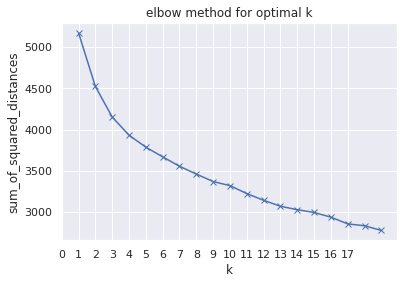

In [67]:
plt.plot(K, sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('sum_of_squared_distances')
plt.title('elbow method for optimal k')
plt.xticks(np.arange(0, 18, 1))
plt.show() #drop in the sum of squared distance starts to slow down after k=X

In [72]:
#Run the K Means clustering algorithm
k_means = KMeans(n_clusters = 11)
model = k_means.fit(X)

#Generate cluster predictions and store in y_hat
y_hat = k_means.predict(X)

labels = k_means.labels_
metrics.silhouette_score(X, labels, metric = 'euclidean') #silhouette score - higher the better

0.09207991119693625

In [73]:
cols = list(scaler_data)

centers = model.cluster_centers_
#cols_of_interest = ['Emerging','Affiliate Size','Geo']
#function that creates a dataframe with a column for cluster number
def pd_centers(cols_of_interest, centers):
        colNames = list(cols_of_interest)
        colNames.append('prediction')
# Zip with a column called 'prediction' (index)
        Z = [np.append(A, index) for index, A in enumerate(centers)]
# Convert to pandas data frame for plotting
        P = pd.DataFrame(Z, columns=colNames)
        P['prediction'] = P['prediction'].astype(int)
        return P
P = pd_centers(cols,centers)
P

,Premise,Total Sales,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,BRANDY,CANADIAN WHISKEY,COCKTAILS,...,Male,Avg curr_home_value,age range: 19-25,age range: 26-35,age range: 36-45,age range: 46-55,age range: 56-65,age range: 65+,People,prediction
0,0.000000,0.010149,0.031569,0.012121,0.000511,0.006974,0.066808,0.022180,0.082846,0.002339,...,0.417795,0.294572,0.021500,0.062939,0.126343,0.169907,0.230110,0.493621,0.135397,0
1,0.000000,0.010096,0.032204,0.013617,0.000031,0.007707,0.056865,0.053951,0.085974,0.003531,...,0.442338,0.199491,0.027398,0.141859,0.249342,0.208237,0.269830,0.293629,0.117518,1
2,0.000000,0.019604,0.009207,0.002790,0.000160,0.016141,0.045763,0.026238,0.027568,0.001593,...,0.498092,0.560846,0.023978,0.111016,0.224681,0.304627,0.258986,0.247904,0.127433,2
3,0.000000,0.016242,0.002276,0.000513,0.000000,0.034385,0.018852,0.003984,0.006246,0.001178,...,0.490260,0.722104,0.018600,0.087949,0.123721,0.152748,0.236151,0.491784,0.098781,3
4,0.000000,0.008704,0.001226,0.000188,0.000540,0.030033,0.008852,0.003020,0.003519,0.000932,...,0.445310,0.335374,0.025260,0.108477,0.204324,0.215068,0.256410,0.348734,0.136940,4
5,0.000000,0.019131,0.023569,0.011774,0.000000,0.026758,0.053333,0.052094,0.072258,0.007574,...,0.375784,0.169403,0.022429,0.202084,0.220225,0.246340,0.198974,0.315930,0.052032,5
6,0.000000,0.016364,0.011207,0.003383,0.000000,0.016889,0.059615,0.014054,0.049340,0.000527,...,0.382116,0.425051,0.004560,0.091207,0.092677,0.048144,0.116874,0.727304,0.167062,6
7,0.000000,0.005650,0.039961,0.010788,0.000000,0.029940,0.052496,0.049386,0.091784,0.023122,...,0.381468,0.104133,0.842568,0.183330,0.177373,0.205219,0.350442,0.241409,0.101538,7
8,0.000000,0.001407,0.000600,0.000117,0.001069,0.055602,0.002352,0.000818,0.001748,0.007702,...,0.441586,0.307966,0.029318,0.101801,0.179595,0.205348,0.257599,0.376677,0.143705,8
9,0.000000,0.014874,0.013522,0.003814,0.000015,0.007047,0.061092,0.015865,0.048667,0.000303,...,0.503572,0.640892,0.017359,0.053910,0.124917,0.119961,0.241328,0.534691,0.095825,9


In [75]:
#sample_df.append(model.labels_)
on_prem['PREDS'] = pd.Series(model.labels_, index=on_prem.index)
on_prem

<ipython-input-75-e1d980a8c72c>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  on_prem['PREDS'] = pd.Series(model.labels_, index=on_prem.index)


,Name,Zip,Premise,Total Sales,AMERICAN BLEND,AMERICAN WHISKEY,BEER,BLUSH/ROSE WINE,BOURBON,BRANDY,...,Male,Avg curr_home_value,age range: 19-25,age range: 26-35,age range: 36-45,age range: 46-55,age range: 56-65,age range: 65+,People,PREDS
0,#00 SALOON #00 STATION,33312,1,36565.700000,0.000000,0.000000,0.000000,0.000000,0.022759,0.311988,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
6,BROWARD CTR PERFORMING AR,33312,1,68008.420000,0.000198,0.000000,0.000000,0.008920,0.015675,0.002880,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,2
8,CLOUD NINE LOUNGE,33312,1,14771.950000,0.000000,0.060004,0.000000,0.002282,0.014336,0.305649,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
15,DON ARTURO RESTAURANT & B,33312,1,1831.800000,0.000000,0.000000,0.000000,0.000000,0.000000,0.071487,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
20,FLANIGAN'S #22 (ON),33312,1,17528.210000,0.002183,0.000000,0.000000,0.004181,0.031616,0.060317,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
21,FLOSSIES BAR & GRILL,33312,1,22569.850000,0.006079,0.006861,0.000000,0.006514,0.045333,0.008816,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
26,JAYS BAR,33312,1,18557.460000,0.001975,0.003074,0.000000,0.016096,0.028045,0.276588,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
30,LAUDERDALE EAGLES 3140 IN,33312,1,7021.440000,0.001176,0.007350,0.000000,0.013544,0.083266,0.007288,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
32,MY BIG FAT GREEK RESTAURA,33312,1,4665.120000,0.003537,0.000000,0.000000,0.008982,0.048496,0.008060,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1
33,ORIGINAL FAT CATS,33312,1,74697.820000,0.004870,0.000110,0.000000,0.000000,0.033388,0.032897,...,0.592409,370.808581,0.001894,0.053030,0.189394,0.221591,0.223485,0.312500,606,1


In [76]:
#Group the data based on clusters
cols = list(on_prem)
cols.remove('Name')
cols.remove('PREDS')

pd.set_option('display.float_format', lambda x: '%f' % x)
#pd.reset_option('display.float_format')

group_data = on_prem.groupby('PREDS')[cols].mean()
group_data = group_data.transpose()
pd.set_option('display.max_rows',None)

group_data

PREDS,0,1,2,3,4,5,6,7,8,9,10
Zip,33878.902439,33605.569246,33327.602686,33512.535552,33495.130769,33490.680217,33795.340909,33787.637255,33589.185762,33628.488906,33156.000000
Premise,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Total Sales,15458.143638,15376.794959,29857.448728,24736.992829,13257.233554,29137.877669,24923.157348,8605.938922,2143.183660,22654.062670,11637.094444
AMERICAN BLEND,0.008040,0.008202,0.002345,0.000580,0.000312,0.006003,0.002854,0.010177,0.000153,0.003444,0.000476
AMERICAN WHISKEY,0.004871,0.005472,0.001121,0.000206,0.000076,0.004732,0.001360,0.004335,0.000047,0.001533,0.000116
BEER,0.000038,0.000002,0.000012,0.000000,0.000040,0.000000,0.000000,0.000000,0.000079,0.000001,0.000004
BLUSH/ROSE WINE,0.006940,0.007670,0.016063,0.034219,0.029889,0.026629,0.016808,0.029796,0.055334,0.007013,0.028307
BOURBON,0.061128,0.052030,0.041872,0.017249,0.008099,0.048799,0.054546,0.048033,0.002152,0.055898,0.032996
BRANDY,0.022168,0.053923,0.026224,0.003982,0.003018,0.052067,0.014047,0.049360,0.000817,0.015857,0.014020
CANADIAN WHISKEY,0.060588,0.062876,0.020161,0.004568,0.002573,0.052845,0.036084,0.067125,0.001278,0.035592,0.005901


In [35]:
pivottt = pd.pivot_table(off_prem, values='Total Sales',
index=['PREDS'],
aggfunc=np.count_nonzero)
pivottt

,Total Sales
PREDS,
0,1569.000000
1,1589.000000
2,3553.000000
